# Project: Exploratory Data Analysis(EDA) on Used Cars Sales Dataset 

Navigating the sale of used cars often involves the challenge of setting competitive prices. Many individuals turn to online platforms like Autotrader, where they compare prices considering factors like the car's age, mileage, body type, and fuel type. However, this method can be cumbersome for those seeking a more streamlined approach. Some prefer the convenience of inputting specific details about their vehicles and instantly receiving a predicted price.

This project aims are guided by two questions:

1. To analyze AutoTrader car sales dataset to identify the most influential predictors of a vehicle's price. I aim to uncover the features, either individually or in combination, that exhibit the strongest correlation with the price variable. I will delve into the explanations and insights behind these findings.

2. Furthermore,1 will explore intriguing patterns within the data, considering groupings involving one or more features that demonstrate noteworthy differences, such as trends or averages, in prices. The objective is to extract valuable insights from these patterns and assess their potential significance.

In [25]:
# Essential Configuration
%matplotlib inline
%config InlineBackend.figure_formats = {'retina', 'svg'}

# Core Libraries
import pandas as pd
import numpy as np
import warnings
warnings.filterwarnings('ignore')

# Visualization Libraries
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.colors import LinearSegmentedColormap
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.gridspec as gridspec
from matplotlib import colors as mcolors
import plotly.graph_objects as go
from plotly.offline import init_notebook_mode
init_notebook_mode(connected=True)


# Scikit-learn Libraries

from sklearn.impute import SimpleImputer


# Display Settings
pd.set_option('display.max_columns', None)  # Show all columns
pd.set_option('display.width', None)        # Adjust the display width to accommodate all columns

# Seaborn Default Settings
sns.set(
    {
        "figure.figsize": (8, 6)
    },
    style='ticks',
    color_codes=True,
    font_scale=0.8
)


# other libraries
from phik import phik_matrix

# PART 1 - Data Understanding and Exploration

In [26]:
# Load dataset using panda read_csv to and check first three rows
df = pd.read_csv('used_car_data.csv')
df.head()

,public_reference,mileage,reg_code,standard_colour,standard_make,standard_model,vehicle_condition,year_of_registration,price,body_type,crossover_car_and_van,fuel_type
0,202006039777689,0.0,NaN,Grey,Volvo,XC90,NEW,NaN,73970,SUV,False,Petrol Plug-in Hybrid
1,202007020778260,108230.0,61,Blue,Jaguar,XF,USED,2011.0,7000,Saloon,False,Diesel
2,202007020778474,7800.0,17,Grey,SKODA,Yeti,USED,2017.0,14000,SUV,False,Petrol
3,202007080986776,45000.0,16,Brown,Vauxhall,Mokka,USED,2016.0,7995,Hatchback,False,Diesel
4,202007161321269,64000.0,64,Grey,Land Rover,Range Rover Sport,USED,2015.0,26995,SUV,False,Diesel


# Data Features

The features in the dataset convey the following information:

1.  Standard make(Categorical): This represents the brand name of the car manufacturer.
2.  Public reference(Numeric): This seems to be numerical code used to reference the car on the website.
3.  Standard model(Categorical): This is the specific model of the car as listed on the website.
4.  Reg code(Numeric): This code signifies the year the car was registered.
5.  Fuel type(Categorical): This indicates the type of fuel used to power the car, such as Petrol, Diesel, Bio, Gas, and so forth.
6.  Standard colour(Categorical): This refers to the standard colour variant of the car.
7.  Vehicle condition(Categorical): This column denotes whether the car is new or used.
8.  Mileage(Numeric): This refers to the total distance covered by the car.
9.  Year of registration(Numeric): This is the year when the car was registered, useful for determining its age.
10. Crossover car and van(Boolean): This indicates whether the car is classified as a crossover.
11. Body type(Categorical): This describes the body type of the car, such as Hatchback, Coupe, SUV, Saloon, etc
12. Price(Numeric): This is the listed selling price for the car in Pounds (£).

In [3]:
# Check dataset shape
print(f"The Dataset shape is: {df.shape}")

print("----------------------------------")

# Dataset info
df.info()

The Dataset shape is: (402005, 12)
----------------------------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 402005 entries, 0 to 402004
Data columns (total 12 columns):
 #   Column                 Non-Null Count   Dtype  
---  ------                 --------------   -----  
 0   public_reference       402005 non-null  int64  
 1   mileage                401878 non-null  float64
 2   reg_code               370148 non-null  object 
 3   standard_colour        396627 non-null  object 
 4   standard_make          402005 non-null  object 
 5   standard_model         402005 non-null  object 
 6   vehicle_condition      402005 non-null  object 
 7   year_of_registration   368694 non-null  float64
 8   price                  402005 non-null  int64  
 9   body_type              401168 non-null  object 
 10  crossover_car_and_van  402005 non-null  bool   
 11  fuel_type              401404 non-null  object 
dtypes: bool(1), float64(2), int64(2), object(7)
memory usage: 34.1+ MB


In [4]:
# Check for missing values and percentage of missing values
missing_values = df.isnull().sum()
missing_percentage = 100 * df.isnull().sum() / len(df)

# Combine the results into a single DataFrame for better readability
missing_summary = pd.DataFrame({
    'Missing Values': missing_values,
    'Percentage': missing_percentage
})

print("Missing Value Description:")
print(missing_summary)

Missing Value Description:
                       Missing Values  Percentage
public_reference                    0    0.000000
mileage                           127    0.031592
reg_code                        31857    7.924528
standard_colour                  5378    1.337794
standard_make                       0    0.000000
standard_model                      0    0.000000
vehicle_condition                   0    0.000000
year_of_registration            33311    8.286215
price                               0    0.000000
body_type                         837    0.208206
crossover_car_and_van               0    0.000000
fuel_type                         601    0.149501


In [5]:
# Displaying the number of duplicate rows
print(f"The dataset contains {df.duplicated().sum()} duplicate rows that need to be removed.")

print("---------------------------------------")

# Check unique values
print(f"Unique values:\n{df.nunique()}")

The dataset contains 0 duplicate rows that need to be removed.
---------------------------------------
Unique values:
public_reference         402005
mileage                   80634
reg_code                     72
standard_colour              22
standard_make               110
standard_model             1168
vehicle_condition             2
year_of_registration         84
price                     30578
body_type                    16
crossover_car_and_van         2
fuel_type                     9
dtype: int64


In [6]:
# Check Null Value Counts and Datatypes of the features
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 402005 entries, 0 to 402004
Data columns (total 12 columns):
 #   Column                 Non-Null Count   Dtype  
---  ------                 --------------   -----  
 0   public_reference       402005 non-null  int64  
 1   mileage                401878 non-null  float64
 2   reg_code               370148 non-null  object 
 3   standard_colour        396627 non-null  object 
 4   standard_make          402005 non-null  object 
 5   standard_model         402005 non-null  object 
 6   vehicle_condition      402005 non-null  object 
 7   year_of_registration   368694 non-null  float64
 8   price                  402005 non-null  int64  
 9   body_type              401168 non-null  object 
 10  crossover_car_and_van  402005 non-null  bool   
 11  fuel_type              401404 non-null  object 
dtypes: bool(1), float64(2), int64(2), object(7)
memory usage: 34.1+ MB


In [7]:
# Check duplicate values
df.duplicated().sum()

# Checking for number of unique values of each column
df.nunique()

public_reference         402005
mileage                   80634
reg_code                     72
standard_colour              22
standard_make               110
standard_model             1168
vehicle_condition             2
year_of_registration         84
price                     30578
body_type                    16
crossover_car_and_van         2
fuel_type                     9
dtype: int64

In [8]:
# Check unique values for categorical features
print("Unique Values in Categorical Features:")
print("---------------------------------------")
print(f"1. standard_colour: {df['standard_colour'].unique()}")
print("---------------------------------------")
print(f"2. body_type: {df['body_type'].unique()}")
print("---------------------------------------")
print(f"3. fuel_type' : {df['fuel_type'].unique()}")
print("---------------------------------------")
print(f"4. vehicle_condition: {df['vehicle_condition'].unique()}")


Unique Values in Categorical Features:
---------------------------------------
1. standard_colour: ['Grey' 'Blue' 'Brown' 'Red' 'Bronze' 'Black' 'White' 'Silver' nan
 'Purple' 'Green' 'Orange' 'Yellow' 'Turquoise' 'Gold' 'Multicolour'
 'Beige' 'Burgundy' 'Pink' 'Maroon' 'Magenta' 'Navy' 'Indigo']
---------------------------------------
2. body_type: ['SUV' 'Saloon' 'Hatchback' 'Convertible' 'Limousine' 'Estate' 'MPV'
 'Coupe' nan 'Pickup' 'Combi Van' 'Panel Van' 'Minibus' 'Window Van'
 'Camper' 'Car Derived Van' 'Chassis Cab']
---------------------------------------
3. fuel_type' : ['Petrol Plug-in Hybrid' 'Diesel' 'Petrol' 'Diesel Hybrid' 'Petrol Hybrid'
 'Electric' 'Diesel Plug-in Hybrid' nan 'Bi Fuel' 'Natural Gas']
---------------------------------------
4. vehicle_condition: ['NEW' 'USED']


In [9]:
# Display Data statistics of the Dataframe
df.describe(include='all').round(2)

,public_reference,mileage,reg_code,standard_colour,standard_make,standard_model,vehicle_condition,year_of_registration,price,body_type,crossover_car_and_van,fuel_type
count,4.020050e+05,401878.00,370148,396627,402005,402005,402005,368694.00,402005.00,401168,402005,401404
unique,NaN,NaN,72,22,110,1168,2,NaN,NaN,16,2,9
top,NaN,NaN,17,Black,BMW,Golf,USED,NaN,NaN,Hatchback,False,Petrol
freq,NaN,NaN,36738,86287,37376,11583,370756,NaN,NaN,167315,400210,216929
mean,2.020071e+14,37743.60,NaN,NaN,NaN,NaN,NaN,2015.01,17341.97,NaN,NaN,NaN
std,1.691662e+10,34831.72,NaN,NaN,NaN,NaN,NaN,7.96,46437.46,NaN,NaN,NaN
min,2.013072e+14,0.00,NaN,NaN,NaN,NaN,NaN,999.00,120.00,NaN,NaN,NaN
25%,2.020090e+14,10481.00,NaN,NaN,NaN,NaN,NaN,2013.00,7495.00,NaN,NaN,NaN
50%,2.020093e+14,28629.50,NaN,NaN,NaN,NaN,NaN,2016.00,12600.00,NaN,NaN,NaN
75%,2.020102e+14,56875.75,NaN,NaN,NaN,NaN,NaN,2018.00,20000.00,NaN,NaN,NaN


#  Initial observations on Data exploration:

1. Dataset Size:There are 402500 rows and 12 columns in the dataset. 'NEW' Cars is about 8% of the dataset, while the rest are for 'USED' cars.

2. Missing Values: Six columns exhibit missing/null values that require attention:-

  * mileage(127 rows), reg code(31,857 rows) , colour(5,578 rows), year of registration(33,311 rows),body type(837 rows) and fuel type(601 rows).

3. Numeric and Categorical Features: Out of the 12 features, four are numeric (public_reference, mileage, year_of_registration, price), and the remaining are categorical.

4. Duplicates:No duplicate values were identified in the dataset.

5. Variety in Categories: There are 110 different car brands, 1,168 car models, 16 distinct body types, 9 fuel types, and 22 unique car colours.

6. Outliers in Mileage and Price: Mileage ranges from 0 to 999,999 miles, warranting further investigation.Price ranges from 120 to 9,999,999, requiring additional scrutiny.

7. Outlier in Year of Registration: The 'year_of_registration' column contains a minimum value of 999, which is an outlier and needs correction.

8. Correction of NaN Values: Mileage and Year of registration also have NaN values that need correction.

# 2.0 Exploratory Data Analysis (EDA)

# 2.1 PRICE and MILEAGE - First inspection(Numerical)

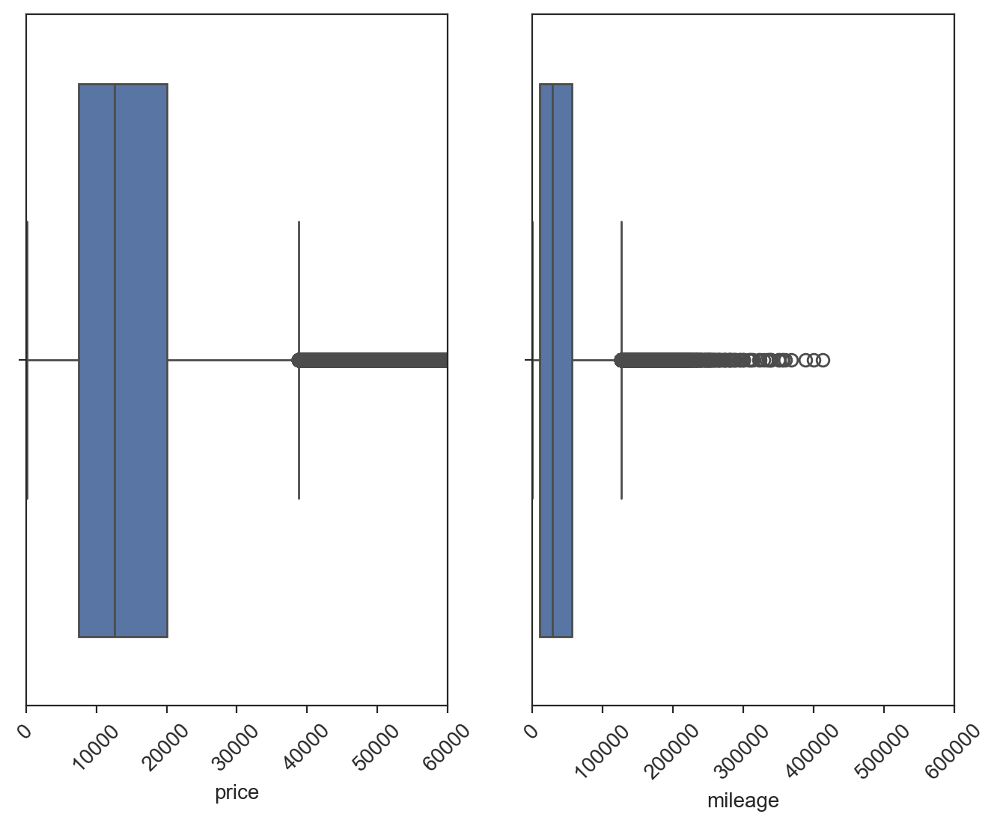

In [10]:
# To plot the price distribution - with outliers
plt.subplot(1,2,1)
plt.xlim(0,60000)
plt.xticks(rotation=45)
sns.boxplot(data=df, x='price',showfliers=True);
plt.subplot(1,2,2)
plt.xlim(0,600000)
plt.xticks(rotation=45)
sns.boxplot(data=df, x='mileage',showfliers=True);
plt.show()

#  Observations on Price:

1. The mean price is £17,341, with a considerable standard deviation of £46,437, suggesting a dataset with significant price outliers.

2.  Distribution Analysis: A larger proportion of prices falls above the median price of £12,600, indicating a positively skewed distribution.

# Observations on Mileage:

1. Descriptive Statistics: The mean mileage is 37,731 miles, with a substantial standard deviation of 34,832, indicating the presence of outliers in the dataset.

2. Distribution Analysis: A larger proportion of the mileage values are above the median mileage of 28,610 miles, suggesting a positively skewed distribution.

# 2.2 Car Brand and Model

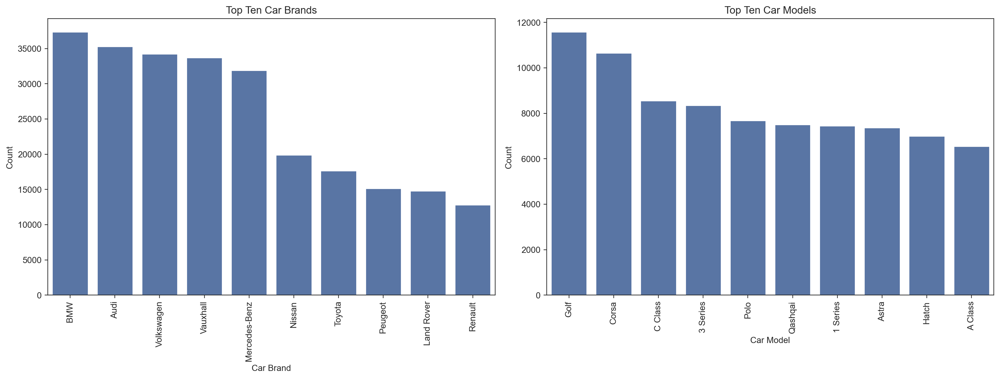

In [11]:
from collections import Counter
import matplotlib.pyplot as plt
import seaborn as sns

# Data for Car Brands
brand_count = Counter(df['standard_make'].dropna().tolist()).most_common(10) 
brand_idx = [brand[0] for brand in brand_count]
brand_val = [brand[1] for brand in brand_count]

# Data for Car Models
model_count = Counter(df['standard_model'].dropna().tolist()).most_common(10) 
model_idx = [model[0] for model in model_count]
model_val = [model[1] for model in model_count]

# Create subplots
fig, axs = plt.subplots(1, 2, figsize=(16, 6), constrained_layout=True)

# Plot for Car Brands
sns.barplot(x=brand_idx, y=brand_val, ax=axs[0])
axs[0].set_title('Top Ten Car Brands')
axs[0].set_xlabel('Car Brand')
axs[0].set_ylabel('Count')
plt.setp(axs[0].get_xticklabels(), rotation=90)

# Plot for Car Models
sns.barplot(x=model_idx, y=model_val, ax=axs[1])
axs[1].set_title('Top Ten Car Models')
axs[1].set_xlabel('Car Model')
axs[1].set_ylabel('Count')
plt.setp(axs[1].get_xticklabels(), rotation=90)

# Show the combined plots
plt.show()


# Observation on Top Ten Car Brands and Models:

1. Brand: Among the top 10 car brands in the dataset, BMW emerges as the most popular, with over 37,000 records. Audi follows closely with approximately 35,000 records, and Volkswagen comes third with around 34,000 records.

2. Model:  Among the top 10 car models in the dataset, Golf emerges as the most popular, with over 11,000 records. Corsa follows closely with approximately 11,000 records, and C Class comes third with around 9,000 records.



# 2.3 Car Colour, Body Type and Fuel Type

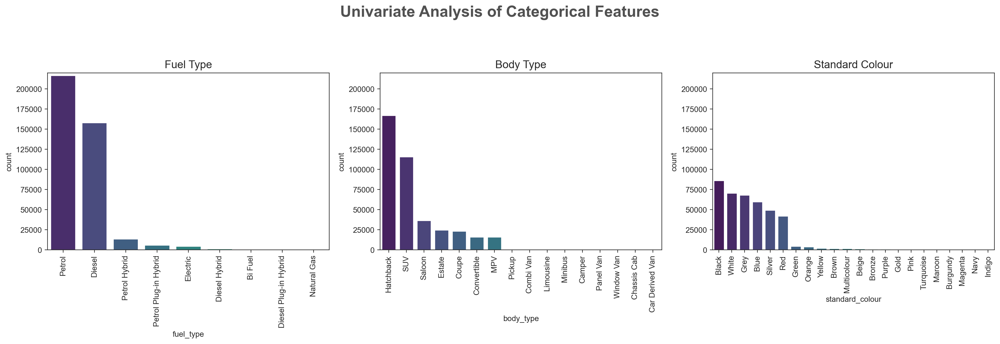

In [12]:
# Sorting function for descending order
def get_sorted_categories(series):
    return series.value_counts().index.tolist()

fig, axes = plt.subplots(1, 3, figsize=(18, 6))  # Adjusted figsize for better spacing
plt.suptitle("Univariate Analysis of Categorical Features", fontsize=20, fontweight='bold', alpha=0.8, y=1.02)

# Plot for 'fuel_type'
plt.subplot(1, 3, 1)
plt.ylim(0, 220000)
sns.countplot(
    x=df['fuel_type'],
    order=get_sorted_categories(df['fuel_type']),
    palette='viridis'
)
plt.xticks(rotation=90)
plt.title("Fuel Type", fontsize=14)

# Plot for 'body_type'
plt.subplot(1, 3, 2)
plt.ylim(0, 220000)
sns.countplot(
    x=df['body_type'],
    order=get_sorted_categories(df['body_type']),
    palette='viridis'
)
plt.xticks(rotation=90)
plt.title("Body Type", fontsize=14)

# Plot for 'standard_colour'
plt.subplot(1, 3, 3)
plt.ylim(0, 220000)
sns.countplot(
    x=df['standard_colour'],
    order=get_sorted_categories(df['standard_colour']),
    palette='viridis'
)
plt.xticks(rotation=90)
plt.title("Standard Colour", fontsize=14)

# Show the plot
plt.tight_layout(rect=[0, 0, 1, 0.95])  # Adjust spacing to fit title
plt.show()


# Observations on Fuel Type, Body Type, and Car Colors:
1. Fuel Type: The most popular fuel type is that of the Petrol engine, followed by Diesel engines. This suggests a preference for traditional fuel sources among car buyers in the dataset.

2. Body Type: Hatchback is the most popular body type, followed by SUV and Saloon. This indicates a significant preference for compact and versatile car designs, potentially driven by factors such as urban lifestyles or fuel efficiency considerations.

3. Car Color: The most sought-after car colors are Black, White, and Grey, followed closely by Blue. This observation suggests a preference for neutral and classic colors among car buyers, which are often associated with timeless and versatile styles.

# 3.0 DATA PRE-PROCESSING
# 3.1 Filling Missing  Values

In [27]:
from sklearn.impute import SimpleImputer

# Create a SimpleImputer instance for categorical data with 'most_frequent' strategy
imputer = SimpleImputer(strategy='most_frequent')

# List of columns to impute
columns_to_impute = ['body_type', 'standard_colour', 'fuel_type']

new_df = df.copy()
new_df[columns_to_impute] = imputer.fit_transform(df[columns_to_impute])


# Create a new DataFrame or modify the original DataFrame with imputed values
#df[columns_to_impute] = imputer.fit_transform(df[columns_to_impute])

# Verify the result
new_df.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 402005 entries, 0 to 402004
Data columns (total 12 columns):
 #   Column                 Non-Null Count   Dtype  
---  ------                 --------------   -----  
 0   public_reference       402005 non-null  int64  
 1   mileage                401878 non-null  float64
 2   reg_code               370148 non-null  object 
 3   standard_colour        402005 non-null  object 
 4   standard_make          402005 non-null  object 
 5   standard_model         402005 non-null  object 
 6   vehicle_condition      402005 non-null  object 
 7   year_of_registration   368694 non-null  float64
 8   price                  402005 non-null  int64  
 9   body_type              402005 non-null  object 
 10  crossover_car_and_van  402005 non-null  bool   
 11  fuel_type              402005 non-null  object 
dtypes: bool(1), float64(2), int64(2), object(7)
memory usage: 34.1+ MB


# 3.2 FEATURE ENGINEERING

# 3.2.1 Filling Missing Values in 'year_of_registration' for 'USED' cars using the reg_year dataframe

In [29]:
# Get current year
from datetime import date
date.today().year

2025

In [30]:
# Created Dataframe containing the key:reg_code, year:year
# Load the data
reg_year = pd.read_csv('reg_year.csv')
reg_year.head()

,reg_code,year
0,1,2001
1,2,2002
2,3,2003
3,4,2004
4,5,2005


In [31]:
#2.2) Filling in `missing value in the 'regsitration year' using reg_year dataframe for 'USED' cars

 # i: Replace the incorrect 'year_of_registration' value with 0
new_df.loc[(new_df['year_of_registration'] >= 999) & (new_df['year_of_registration'] <= 1909), 'year_of_registration'] = 0

 # ii: Replace the rows containing '723xuu' and 'CA' with the right reg code
new_df.loc[new_df['reg_code'].str.contains('723xxu', na=False), 'reg_code'] = '72'
new_df.loc[new_df['reg_code'].str.contains('CA', na=False), 'reg_code'] = '74'

 # ii: Then use reg_year dataframe to fill in the missing car year registration's values
key_column = 'reg_code'
merged_df = pd.merge(new_df, reg_year, how='left', left_on= key_column, right_on= key_column,
                     suffixes=('new_df', 'reg_year'))
column_to_fill = 'year_of_registration'
value_column = 'year'
new_df[column_to_fill].fillna(merged_df[value_column], inplace=True)
new_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 402005 entries, 0 to 402004
Data columns (total 12 columns):
 #   Column                 Non-Null Count   Dtype  
---  ------                 --------------   -----  
 0   public_reference       402005 non-null  int64  
 1   mileage                401878 non-null  float64
 2   reg_code               370148 non-null  object 
 3   standard_colour        402005 non-null  object 
 4   standard_make          402005 non-null  object 
 5   standard_model         402005 non-null  object 
 6   vehicle_condition      402005 non-null  object 
 7   year_of_registration   370384 non-null  float64
 8   price                  402005 non-null  int64  
 9   body_type              402005 non-null  object 
 10  crossover_car_and_van  402005 non-null  bool   
 11  fuel_type              402005 non-null  object 
dtypes: bool(1), float64(2), int64(2), object(7)
memory usage: 34.1+ MB


# Comment:  

  * The process of creating a registration year dataframe and merging it with the car data approach corrected 1,690 missing car year registered records for USED cars, contributing to the overall improvement of data accuracy and completeness using the information from  from Wikipedia in  respect to ‘Vehicle registration plates of the United Kingdom’.

# 3.2.2 Creating Car Age column

In [32]:
# Create Car Age column
# Get current year
from datetime import date
date.today().year

# Compute Car age
def compute_car_age(row):
    current_year = date.today().year
    if row['year_of_registration'] > 0 and row['vehicle_condition'] == 'USED':
        return current_year - row['year_of_registration']
    else:
        return 0
new_df['car_age'] = new_df.apply(compute_car_age, axis=1)
new_df.head()

,public_reference,mileage,reg_code,standard_colour,standard_make,standard_model,vehicle_condition,year_of_registration,price,body_type,crossover_car_and_van,fuel_type,car_age
0,202006039777689,0.0,NaN,Grey,Volvo,XC90,NEW,NaN,73970,SUV,False,Petrol Plug-in Hybrid,0.0
1,202007020778260,108230.0,61,Blue,Jaguar,XF,USED,2011.0,7000,Saloon,False,Diesel,14.0
2,202007020778474,7800.0,17,Grey,SKODA,Yeti,USED,2017.0,14000,SUV,False,Petrol,8.0
3,202007080986776,45000.0,16,Brown,Vauxhall,Mokka,USED,2016.0,7995,Hatchback,False,Diesel,9.0
4,202007161321269,64000.0,64,Grey,Land Rover,Range Rover Sport,USED,2015.0,26995,SUV,False,Diesel,10.0


# 3.2.3 Features Renaming

In [33]:
# Rename columns for easier referencing
columns_to_rename = {'year_of_registration': 'car_reg', 'standard_colour': 'car_colour', 'standard_make':'car_brand',
                     'standard_model':'car_model', 'crossover_car_and_van':'crossover'}
new_df = new_df.rename(columns=columns_to_rename)
new_df.head(1)

,public_reference,mileage,reg_code,car_colour,car_brand,car_model,vehicle_condition,car_reg,price,body_type,crossover,fuel_type,car_age
0,202006039777689,0.0,NaN,Grey,Volvo,XC90,NEW,NaN,73970,SUV,False,Petrol Plug-in Hybrid,0.0


# 3.2.4 Non-relevant Features Removal

In [34]:
# Drop column not needed and rename dataset
columns_to_drop = ['public_reference', 'reg_code', 'car_reg']
new_df = new_df.drop(columns=columns_to_drop)


#  3.2.5 Outliers Removal

In [35]:
# Display Data statistics of the Dataframe
new_df.describe(include='all').round(2)

,mileage,car_colour,car_brand,car_model,vehicle_condition,price,body_type,crossover,fuel_type,car_age
count,401878.00,402005,402005,402005,402005,402005.00,402005,402005,402005,402005.00
unique,NaN,22,110,1168,2,NaN,16,2,9,NaN
top,NaN,Black,BMW,Golf,USED,NaN,Hatchback,False,Petrol,NaN
freq,NaN,91665,37376,11583,370756,NaN,168152,400210,217530,NaN
mean,37743.60,NaN,NaN,NaN,NaN,17341.97,NaN,NaN,NaN,9.16
std,34831.72,NaN,NaN,NaN,NaN,46437.46,NaN,NaN,NaN,4.97
min,0.00,NaN,NaN,NaN,NaN,120.00,NaN,NaN,NaN,-20.00
25%,10481.00,NaN,NaN,NaN,NaN,7495.00,NaN,NaN,NaN,7.00
50%,28629.50,NaN,NaN,NaN,NaN,12600.00,NaN,NaN,NaN,8.00
75%,56875.75,NaN,NaN,NaN,NaN,20000.00,NaN,NaN,NaN,11.00


In [36]:
# Define the columns to check for outliers
numerical_columns = ['mileage', 'price', 'car_age']  # Adjust based on your dataset

# Define a function to remove outliers using the IQR method
def remove_outliers(df, columns):
    for column in columns:
        Q1 = df[column].quantile(0.25)  # First quartile
        Q3 = df[column].quantile(0.75)  # Third quartile
        IQR = Q3 - Q1                  # Interquartile range
        lower_bound = Q1 - 1.5 * IQR   # Lower bound
        upper_bound = Q3 + 1.5 * IQR   # Upper bound
        
        # Remove outliers
        df = df[(df[column] >= lower_bound) & (df[column] <= upper_bound)]
    
    return df

# Apply the function to remove outliers
cleaned_df = remove_outliers(new_df, numerical_columns)

# Verify the cleaned dataset
print("Shape before removing outliers:", new_df.shape)
print("Shape after removing outliers:", cleaned_df.shape)
print("Count of Rows removed:", new_df.shape[0] - cleaned_df.shape[0])
print("Count of Rows(%) removed:", ((new_df.shape[0] - cleaned_df.shape[0]) / new_df.shape[0]) * 100)
cleaned_df.describe()


Shape before removing outliers: (402005, 10)
Shape after removing outliers: (325876, 10)
Count of Rows removed: 76129
Count of Rows(%) removed: 18.937326650166042


,mileage,price,car_age
count,325876.000000,325876.000000,325876.000000
mean,37226.411417,13546.014104,9.224285
std,28652.014500,7861.010739,2.974683
min,0.000000,250.000000,1.000000
25%,14496.750000,7695.000000,7.000000
50%,30281.000000,11995.000000,9.000000
75%,54515.000000,17950.000000,11.000000
max,126445.000000,39485.000000,17.000000


# 4.0 Predictive Power Features Analysis & Asscociations


# 4. 1 Correlation Analysis

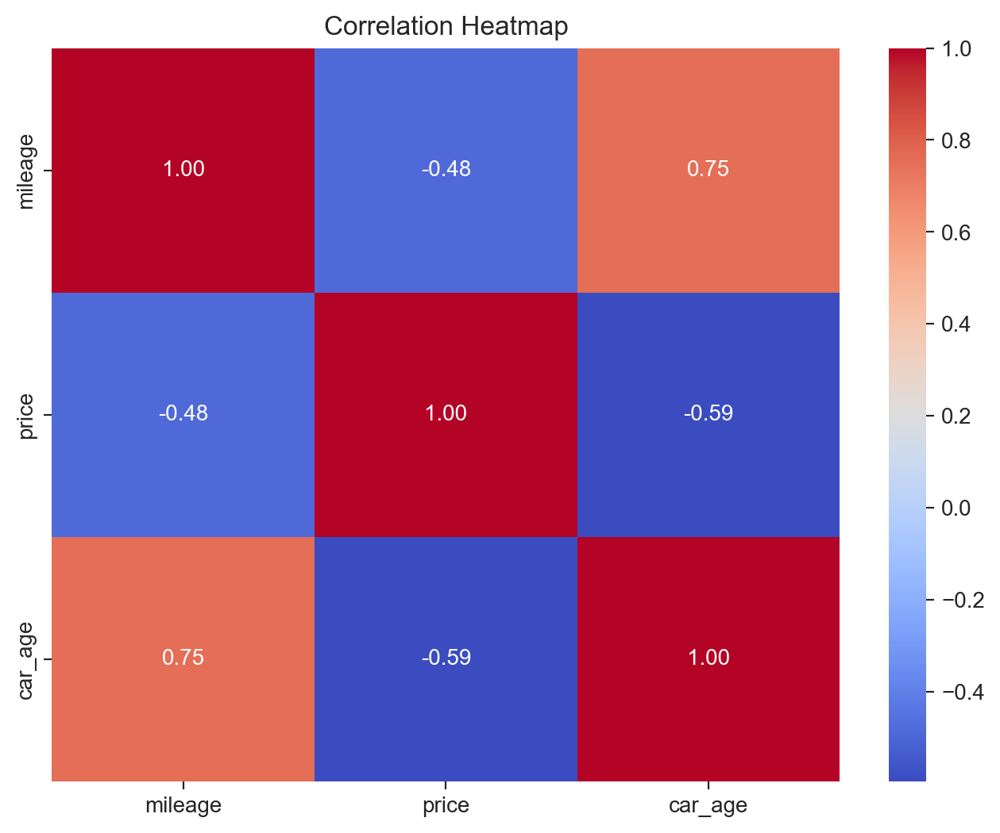

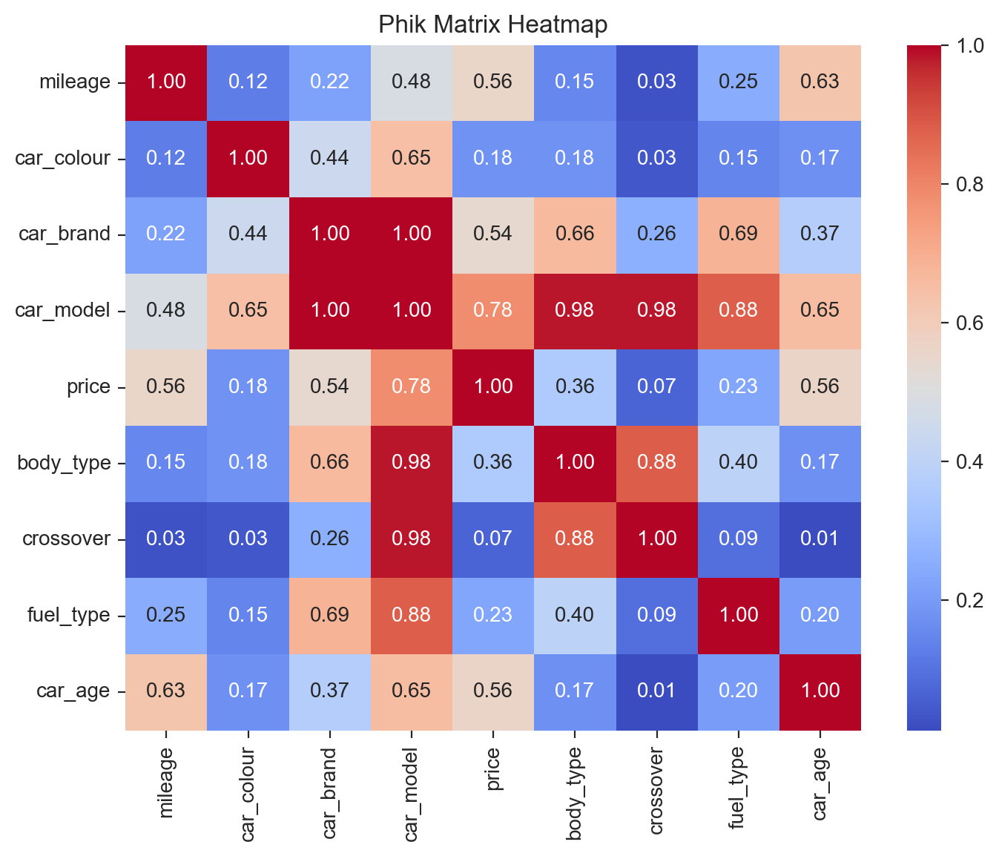

Correlation Ratio Against Price:
price      1.000000
mileage   -0.483068
car_age   -0.594845
dtype: float64
Features to keep:
Index(['car_colour', 'car_brand', 'car_model', 'vehicle_condition', 'price',
       'body_type', 'crossover', 'fuel_type', 'car_age'],
      dtype='object')
feature_to_drop
mileage


In [38]:
# Using phik matrix
df = pd.DataFrame(cleaned_df)

# Compute Phik matrix
phik_matrix_df = df.phik_matrix(interval_cols=df.select_dtypes(include='number').columns)

# Compute correlation ratio against price for numerical features
correlation_ratio = df.select_dtypes(include='number').apply(lambda x: x.corr(df['price']), axis=0)

# Plot heatmap for correlation matrix
plt.figure(figsize=(8, 6))
sns.heatmap(df.select_dtypes(include='number').corr(), annot=True, cmap='coolwarm', fmt=".2f", annot_kws={"size": 10})
plt.title("Correlation Heatmap")
plt.show()

# Plot heatmap for Phik matrix
plt.figure(figsize=(8, 6))
sns.heatmap(phik_matrix_df, annot=True, cmap='coolwarm', fmt=".2f", annot_kws={"size": 10})
plt.title("Phik Matrix Heatmap")
plt.show()

# Display correlation ratio against price
print("Correlation Ratio Against Price:")
#print(correlation_ratio)

# Display correlation of 'price' with other columns
print(correlation_ratio.sort_values(ascending=False))

# Dropping one feature from correlated pairs
# In this case, you might decide to drop based on the highest correlation in the Phik matrix
max_corr = phik_matrix_df.stack().nlargest(2).idxmin()
feature_to_drop = max_corr[1]

# Dropping the identified feature
df.drop(columns=feature_to_drop, inplace=True)

print("Features to keep:")
print(df.columns)

print("feature_to_drop")
print(feature_to_drop)

# Comment(Phik)

Correlation with 'Price':

1. Car Model:  High Correlation:  The feature has high correlation of 0.78 with Price. As expected, the newer the car, the more expensive it is expected to be, generally driven by newer technologies (safety, comfort, efficiency, etc).

2. Car Age and Mileage: Theses features both has 0.56 correlation with Price. As expected, The higher the mileage, the more likely it is prone to wear and tear, and therefore the more likely the price will be lower compared to its newer variants. The greater the car age, the more likely it is prone to wear and tear, and therefore the more likely the price will be lower compared to its newer variants.

3. Car Brand: has 0.54  correlation with Price, As expected, the car brand is a dterminant of price , meand some car brands command more price than some other brands.

4. Body type(0.36) , furel type(0.23), car colour(0.18) : these features has moderate correlation with price but are also detemin of price.

5. Crossover(0.07): This has minimal influen on the car price in the dataset.

# 4.2 Car Price: vs Mileage, Fuel Type , Brand, Model, Body Type ; Mileage vs Fuel Type

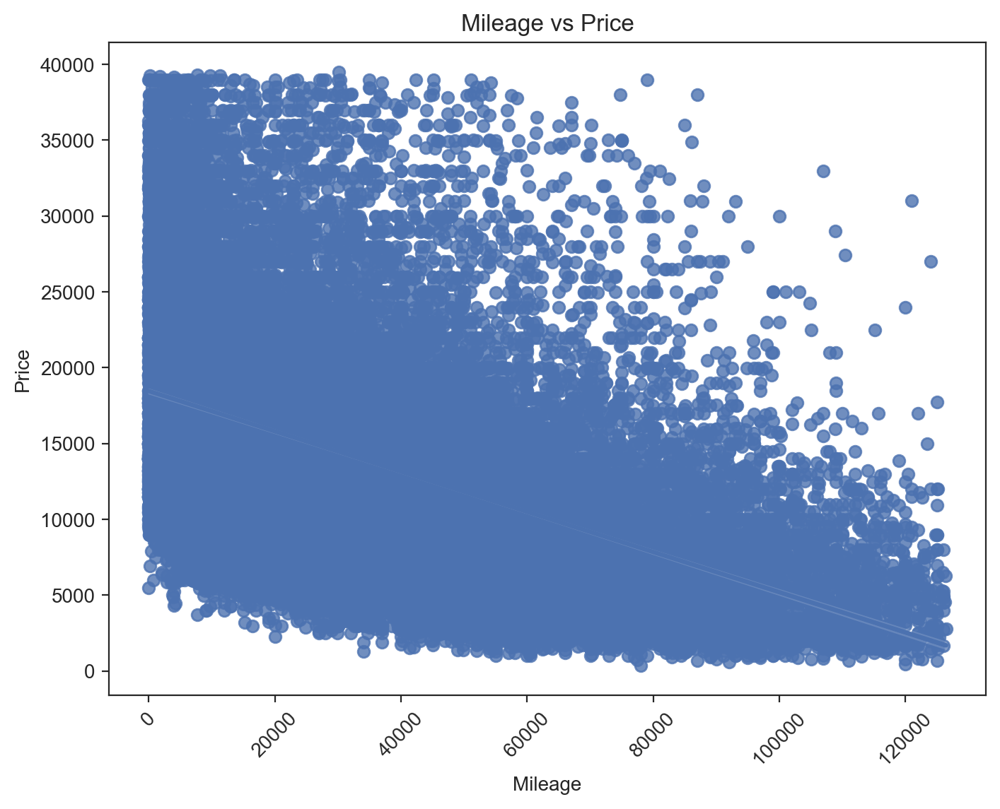

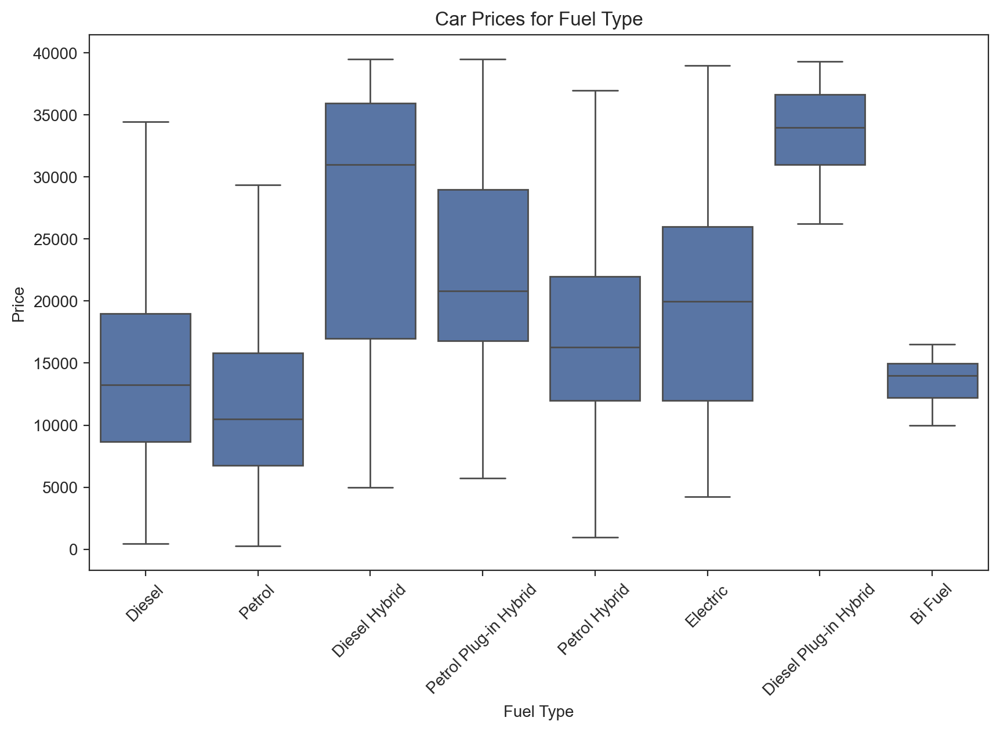

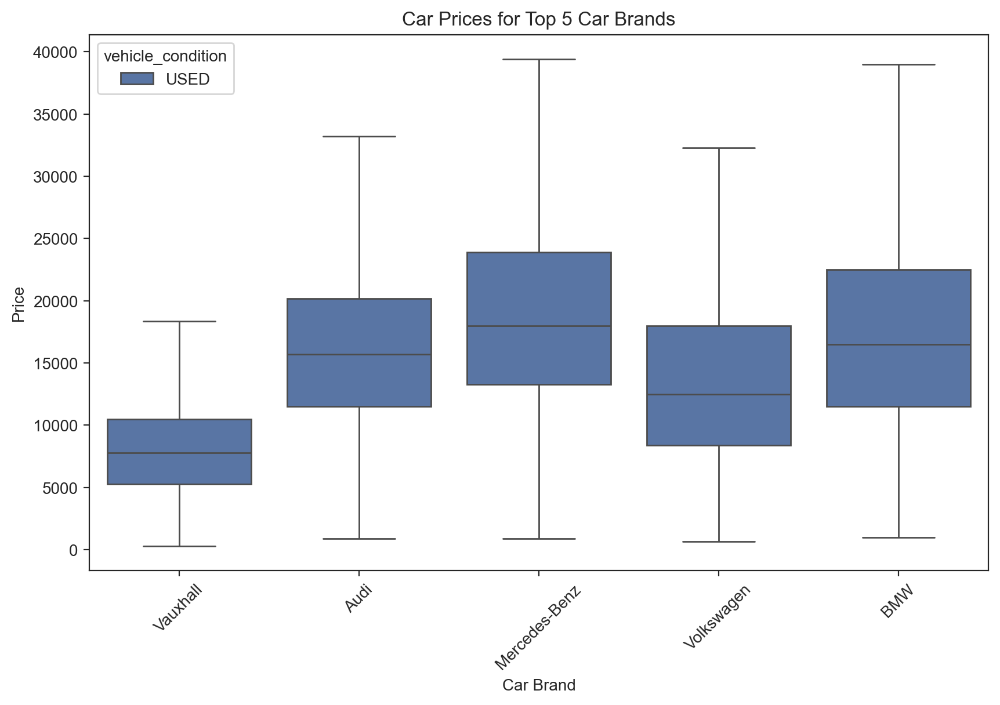

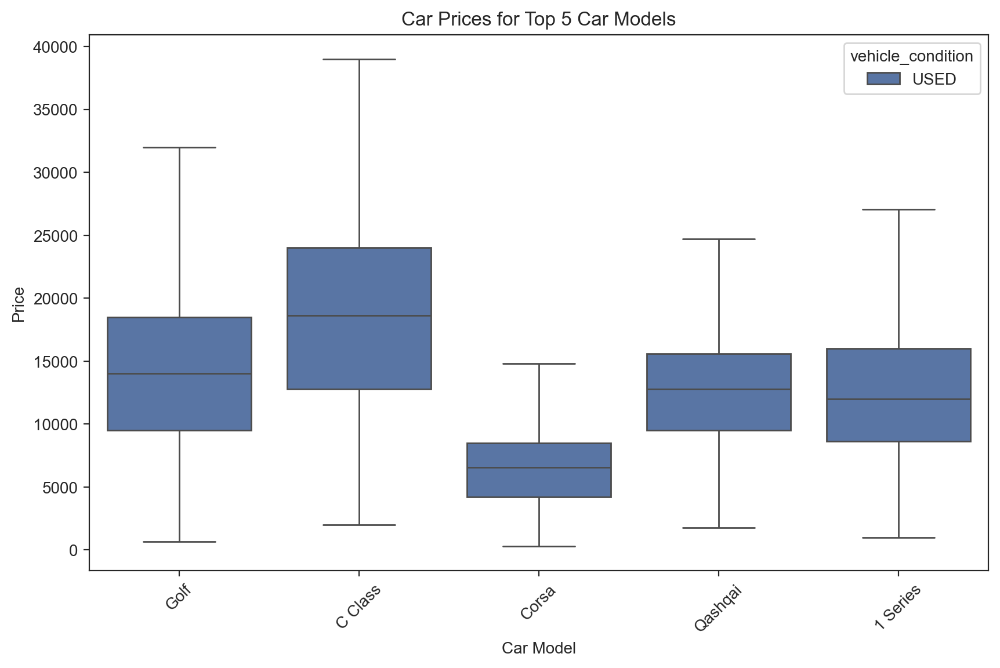

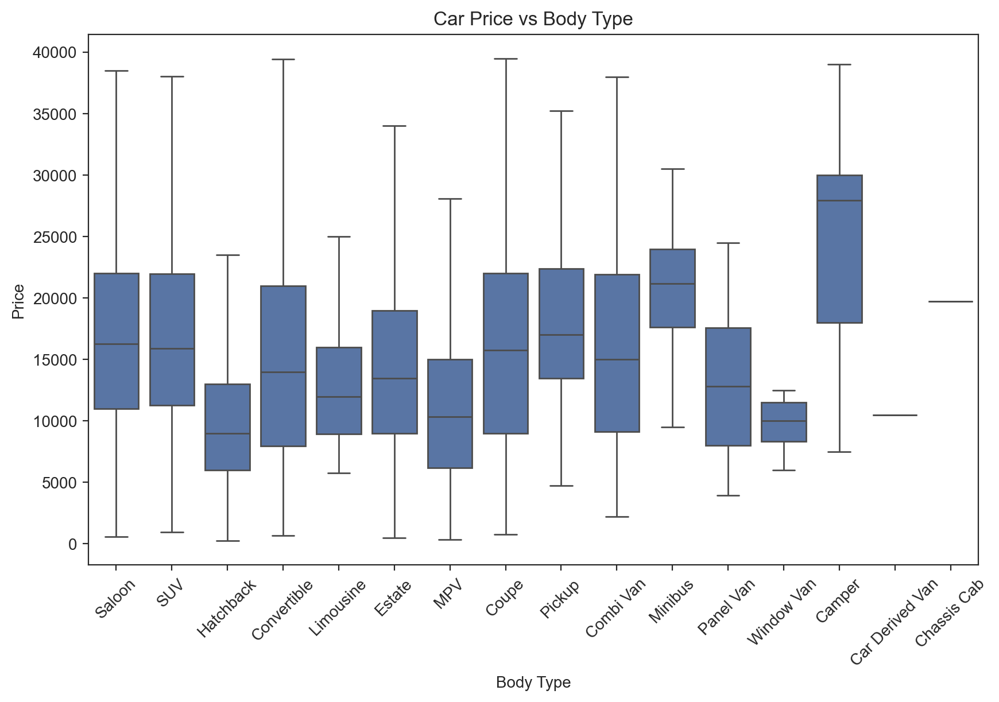

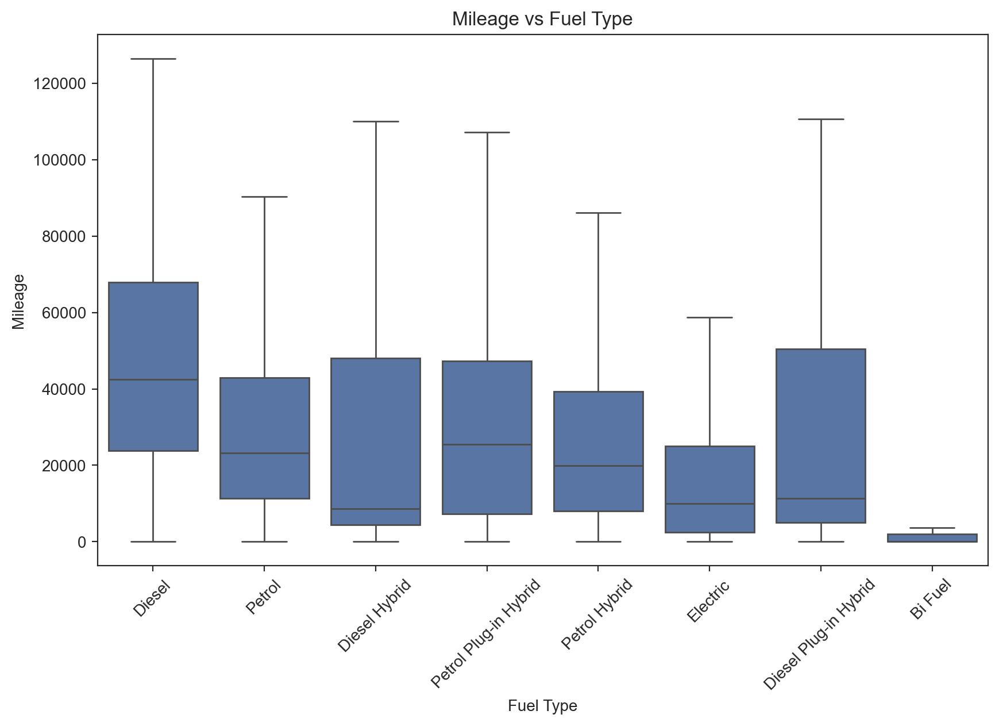

In [39]:
def plot_regression(x, y, data, title, xlabel, ylabel, sample_frac=0.1):
    sampled_data = data.sample(frac=sample_frac)
    sns.regplot(x=x, y=y, data=sampled_data)
    plt.title(title)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.xticks(rotation=45)
    plt.show()

def plot_scatter(x, y, data, title, xlabel, ylabel, sample_frac=0.1):
    sampled_data = data.sample(frac=sample_frac)
    sns.scatterplot(x=x, y=y, data=sampled_data)
    plt.title(title)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.xticks(rotation=45)
    plt.show()

def plot_boxplot(x, y, data, title, xlabel, ylabel, hue=None, showfliers=False, figsize=(10, 6), sample_frac=0.1):
    plt.figure(figsize=figsize)
    sns.boxplot(x=x, y=y, data=data, hue=hue, showfliers=showfliers)
    plt.title(title)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.xticks(rotation=45)
    plt.show()

def get_top_categories(data, column, top_n):
    return data[column].value_counts().nlargest(top_n).index.tolist()

# Mileage vs Price plot
plot_regression(
    x='mileage', y='price', data=cleaned_df,
    title='Mileage vs Price', xlabel='Mileage', ylabel='Price'
)

# Car Age vs Price plot
#plot_scatter(
   # x='car_age', y='price', data=cleaned_df,
   # title='Car Age vs Price', xlabel='Car Age', ylabel='Price'
#)

# Car Prices by Fuel Type
plot_boxplot(
    x='fuel_type', y='price', data=cleaned_df,
    title='Car Prices for Fuel Type', xlabel='Fuel Type', ylabel='Price'
)

# Car Prices by Top 5 Car Brands
top_brands = get_top_categories(cleaned_df, 'car_brand', top_n=5)
top_brands_df = cleaned_df[cleaned_df['car_brand'].isin(top_brands)]
plot_boxplot(
    x='car_brand', y='price', data=top_brands_df, hue='vehicle_condition',
    title='Car Prices for Top 5 Car Brands', xlabel='Car Brand', ylabel='Price'
)

# Car Prices by Top 5 Car Models
top_models = get_top_categories(cleaned_df, 'car_model', top_n=5)
top_models_df = cleaned_df[cleaned_df['car_model'].isin(top_models)]
plot_boxplot(
    x='car_model', y='price', data=top_models_df, hue='vehicle_condition',
    title='Car Prices for Top 5 Car Models', xlabel='Car Model', ylabel='Price'
)

# Car Prices by Body Type
plot_boxplot(
    x='body_type', y='price', data=cleaned_df,
    title='Car Price vs Body Type', xlabel='Body Type', ylabel='Price'
)

# Mileage by Fuel Type
plot_boxplot(
    x='fuel_type', y='mileage', data=cleaned_df,
    title='Mileage vs Fuel Type', xlabel='Fuel Type', ylabel='Mileage'
)


# # Observation:
1. Price vs Mileage: Has inverse relationship between the price of cars and their mileage, indicating that higher-priced cars tend to have lower mileage.

2. Fuel Type vs Price: Petrol plug-in hybrid and Diesel Hybrid contributes to the larger proportion of  the price range distribution.This is followed by Electric , Diesel, Petrol respectively.

3. Car Brand vs Price: For Used Cars Mercedez Benz and BMW are topping the graph, follwed by Audi, Volks wagen and Vauxhall.

4. Car Model vs Price: : Merces-Benz C-Class is topping the distribution in car prices for the top 5 car models, followed by Volkswagen Golf and Merces-Benz 1 series.

5. Car Price vs Body Type:  Copue, Saloon, Convertible and SUV stands out as the top-performing body type in terms of price, displaying  substantial leads. Following closely are estate, combi van and Camper   body types, contributing to the overall trend of higher pricing in these categories.

6. Mileage vs Fuel : It seems Diesel variants(hybrid, main diesel , plug-in-hybrid) are leading the distribution follow by Petrols(hybrid, main petrol , plug-in-hybrid) .





#  KEY FINDINGS

  * What are the best predictors of the price of a vehicle? 

  * The following are the best predictors of price of a vehicle:

     * Age Impact on Price: The age of a vehicle consistently influences its price. Newer cars, associated with lower usage and wear, command higher prices, while older vehicles are priced lower due to increased wear and tear.

     * Mileage as a Decisive Factor: Cars with lower mileage fetch higher prices, indicative of reduced wear and tear, and higher market demand. Thus, mileage serves as a crucial determinant of vehicle prices.

     *  Brand Prestige and Pricing: Globally recognized and prestigious brands command higher prices, driven by consumer perception, quality, and brand image. Thus the brand of the car plays a significant role in determining its price.

  * Additionally, the fuel and body type are crucial predictors of car prices in the market. Fuel-efficient models, known for lower operating costs, tend to have higher resale values and initial  prices. Also, the diverse preferences of consumers play a significant role in the pricing of different body types, with SUVs and crossovers often commanding higher prices due to their perceived versatility and functionality.

